# 전체 교통사고 발생 건수 & 치사율 지도

In [1]:
#!pip install folium

In [2]:
import folium
import pandas as pd
import numpy as np
import glob
import json
from folium import plugins

In [3]:
file_dirs = glob.glob("../data/result/*.xlsx")
files = []
for f_dir in file_dirs:
    tmp = pd.read_excel(f_dir)
    files.append(tmp)

data_kr = pd.concat(files)
data_kr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1145 entries, 0 to 54
Columns: 207 entries, 시도 to 사망_전체
dtypes: float64(4), int64(201), object(2)
memory usage: 1.8+ MB


In [4]:
d_kr_occ = data_kr.iloc[:,[0,1,-2,-1]]
d_kr_occ.head()

,시도,구,발생_전체,사망_전체
0,강원,강릉시,918,22
1,강원,강릉시,888,14
2,강원,강릉시,848,18
3,강원,강릉시,653,17
4,강원,강릉시,712,14


In [5]:
d_kr_occ_5mean = d_kr_occ.groupby(["시도","구"]).mean().reset_index()
d_kr_occ_5mean.head()

,시도,구,발생_전체,사망_전체
0,강원,강릉시,803.8,17.0
1,강원,고성군,133.4,4.4
2,강원,동해시,336.4,4.8
3,강원,삼척시,320.2,8.2
4,강원,속초시,413.4,4.4


In [6]:
d_kr_occ_5mean["치사율(%)"] = (d_kr_occ_5mean["사망_전체"]/d_kr_occ_5mean["발생_전체"]) * 100
d_kr_occ_5mean.head()

,시도,구,발생_전체,사망_전체,치사율(%)
0,강원,강릉시,803.8,17.0,2.114954
1,강원,고성군,133.4,4.4,3.298351
2,강원,동해시,336.4,4.8,1.426873
3,강원,삼척시,320.2,8.2,2.560899
4,강원,속초시,413.4,4.4,1.064344


## 여기까지 d_kr_occ_5mean => fix

### 법정동 코드 추가

In [7]:
sig_code = pd.read_csv("../map/법정동코드 전체자료.txt", sep="\t", encoding="cp949")
sig_cd = sig_code.copy()

In [8]:
sig_cd

,법정동코드,법정동명,폐지여부
0,1100000000,서울특별시,존재
1,1111000000,서울특별시 종로구,존재
2,1111010100,서울특별시 종로구 청운동,존재
3,1111010200,서울특별시 종로구 신교동,존재
4,1111010300,서울특별시 종로구 궁정동,존재
...,...,...,...
49845,5280042024,전북특별자치도 부안군 위도면 대리,존재
49846,5280042025,전북특별자치도 부안군 위도면 거륜리,존재
49847,5280042026,전북특별자치도 부안군 위도면 식도리,존재
49848,5280042027,전북특별자치도 부안군 위도면 상왕등리,존재


In [9]:
for j,i in enumerate(sig_cd["법정동명"]):
    if len(i.split()) == 1:
        sig_cd = sig_cd.drop(j)
sig_cd

,법정동코드,법정동명,폐지여부
1,1111000000,서울특별시 종로구,존재
2,1111010100,서울특별시 종로구 청운동,존재
3,1111010200,서울특별시 종로구 신교동,존재
4,1111010300,서울특별시 종로구 궁정동,존재
5,1111010400,서울특별시 종로구 효자동,존재
...,...,...,...
49845,5280042024,전북특별자치도 부안군 위도면 대리,존재
49846,5280042025,전북특별자치도 부안군 위도면 거륜리,존재
49847,5280042026,전북특별자치도 부안군 위도면 식도리,존재
49848,5280042027,전북특별자치도 부안군 위도면 상왕등리,존재


In [10]:
a = []
for i in sig_cd["법정동명"]:
    if len(i.split()) != 1:
        sd = i.split()[0][:2]
        if sd in ["전라","경상","충청"]:
            sd = i.split()[0][0]+i.split()[0][2]
        a.append(sd+i.split()[1])

In [11]:
sig_cd["법정동명"] = a

In [12]:
sig_cd["폐지여부"].unique()

array(['존재', '폐지'], dtype=object)

In [13]:
#df[df['column_name'].str.startswith('star')]

In [14]:
jb = sig_cd.loc[sig_cd["법정동명"].str.startswith("전북"),:]

In [15]:
jb = jb.loc[jb["폐지여부"] == "폐지",["법정동코드", "법정동명"]]

In [16]:
jb

,법정동코드,법정동명
22408,4505000000,전북금산군
22409,4505001000,전북금산군
22410,4505001001,전북금산군
22411,4505001002,전북금산군
22412,4505001003,전북금산군
...,...,...
25752,4583044022,전북익산군
25753,4583044023,전북익산군
25754,4583044024,전북익산군
25755,4583044025,전북익산군


In [17]:
sig_cd = sig_cd.loc[sig_cd["폐지여부"] == "존재",["법정동코드", "법정동명"]]

In [18]:
f_sig = sig_cd[~sig_cd['법정동명'].str.startswith('전북')]

In [19]:
f_sig = f_sig.iloc[:,:2]

In [20]:
sf_sig = pd.concat([f_sig,jb], ignore_index=True)

In [21]:
sf_sig

,법정동코드,법정동명
0,1111000000,서울종로구
1,1111010100,서울종로구
2,1111010200,서울종로구
3,1111010300,서울종로구
4,1111010400,서울종로구
...,...,...
21991,4583044022,전북익산군
21992,4583044023,전북익산군
21993,4583044024,전북익산군
21994,4583044025,전북익산군


In [22]:
sig_cd = sf_sig

In [23]:
sig_cd["법정동코드"] = sig_cd["법정동코드"].astype(str).str[:-5]

In [24]:
sig_cd_f = sig_cd.drop_duplicates()

In [25]:
sig_cd_f

,법정동코드,법정동명
0,11110,서울종로구
88,11140,서울중구
163,11170,서울용산구
200,11200,서울성동구
218,11215,서울광진구
...,...,...
21171,45790,전북고창군
21378,45800,전북부안군
21507,45810,전북김제군
21681,45820,전북옥구군


In [26]:
sig_cd_f = sig_cd_f.reset_index()
sig_cd_f = sig_cd_f.iloc[:,1:]

In [27]:
sig_cd_f.columns = ["SIG_CD","시도구"]
sig_cd_f

,SIG_CD,시도구
0,11110,서울종로구
1,11140,서울중구
2,11170,서울용산구
3,11200,서울성동구
4,11215,서울광진구
...,...,...
299,45790,전북고창군
300,45800,전북부안군
301,45810,전북김제군
302,45820,전북옥구군


In [28]:
sig_cd_f.loc[sig_cd_f["시도구"] == "대구군위군",["시도구"]] = "경북군위군"

In [29]:
sig_cd_f.loc[sig_cd_f["시도구"] == "세종반곡동",["시도구"]] = "세종세종"

In [30]:
sig_cd_f.to_excel("../map/SIG_CD.xlsx", index=False)

In [31]:
sig_list = ['11110', '11140', '11170', '11200', '11215', '11230', '11260', '11290', '11305', '11320', '11350', '11380', '11410', '11440', '11470', '11500', '11530', '11545', '11560', '11590', '11620', '11650', '11680', '11710', '11740', '26110', '26140', '26170', '26200', '26230', '26260', '26290', '26320', '26350', '26380', '26410', '26440', '26470', '26500', '26530', '26710', '27110', '27140', '27170', '27200', '27230', '27260', '27290', '27710', '27720', '28110', '28140', '28177', '28185', '28200', '28237', '28245', '28260', '28710', '28720', '29110', '29140', '29155', '29170', '29200', '30110', '30140', '30170', '30200', '30230', '31110', '31140', '31170', '31200', '31710', '36110', '41111', '41113', '41115', '41117', '41131', '41133', '41135', '41150', '41171', '41173', '41190', '41210', '41220', '41250', '41271', '41273', '41281', '41285', '41287', '41290', '41310', '41360', '41370', '41390', '41410', '41430', '41450', '41461', '41463', '41465', '41480', '41500', '41550', '41570', '41590', '41610', '41630', '41650', '41670', '41800', '41820', '41830', '43111', '43112', '43113', '43114', '43130', '43150', '43720', '43730', '43740', '43745', '43750', '43760', '43770', '43800', '44131', '44133', '44150', '44180', '44200', '44210', '44230', '44250', '44270', '44710', '44760', '44770', '44790', '44800', '44810', '44825', '45111', '45113', '45130', '45140', '45180', '45190', '45210', '45710', '45720', '45730', '45740', '45750', '45770', '45790', '45800', '46110', '46130', '46150', '46170', '46230', '46710', '46720', '46730', '46770', '46780', '46790', '46800', '46810', '46820', '46830', '46840', '46860', '46870', '46880', '46890', '46900', '46910', '47111', '47113', '47130', '47150', '47170', '47190', '47210', '47230', '47250', '47280', '47290', '47730', '47750', '47760', '47770', '47820', '47830', '47840', '47850', '47900', '47920', '47930', '47940', '48121', '48123', '48125', '48127', '48129', '48170', '48220', '48240', '48250', '48270', '48310', '48330', '48720', '48730', '48740', '48820', '48840', '48850', '48860', '48870', '48880', '48890', '50110', '50130', '51110', '51130', '51150', '51170', '51190', '51210', '51230', '51720', '51730', '51750', '51760', '51770', '51780', '51790', '51800', '51810', '51820', '51830']

### 여기까지 법정동명 df만들었음

In [32]:
d_kr_occ_5mean["시도구"] = d_kr_occ_5mean["시도"]+d_kr_occ_5mean["구"]

In [33]:
d_kr_occ_5mean

,시도,구,발생_전체,사망_전체,치사율(%),시도구
0,강원,강릉시,803.8,17.0,2.114954,강원강릉시
1,강원,고성군,133.4,4.4,3.298351,강원고성군
2,강원,동해시,336.4,4.8,1.426873,강원동해시
3,강원,삼척시,320.2,8.2,2.560899,강원삼척시
4,강원,속초시,413.4,4.4,1.064344,강원속초시
...,...,...,...,...,...,...
224,충북,제천시,798.0,17.4,2.180451,충북제천시
225,충북,증평군,180.2,3.0,1.664817,충북증평군
226,충북,진천군,495.8,13.2,2.662364,충북진천군
227,충북,청주시,4532.2,59.4,1.310622,충북청주시


In [34]:
new_data = pd.merge(d_kr_occ_5mean,sig_cd_f, on = "시도구", how = "left")
new_data

,시도,구,발생_전체,사망_전체,치사율(%),시도구,SIG_CD
0,강원,강릉시,803.8,17.0,2.114954,강원강릉시,51150
1,강원,고성군,133.4,4.4,3.298351,강원고성군,51820
2,강원,동해시,336.4,4.8,1.426873,강원동해시,51170
3,강원,삼척시,320.2,8.2,2.560899,강원삼척시,51230
4,강원,속초시,413.4,4.4,1.064344,강원속초시,51210
...,...,...,...,...,...,...,...
259,충북,청주시,4532.2,59.4,1.310622,충북청주시,43111
260,충북,청주시,4532.2,59.4,1.310622,충북청주시,43112
261,충북,청주시,4532.2,59.4,1.310622,충북청주시,43113
262,충북,청주시,4532.2,59.4,1.310622,충북청주시,43114


In [35]:
new_data[new_data["시도"]=="전북"]

,시도,구,발생_전체,사망_전체,치사율(%),시도구,SIG_CD
214,전북,고창군,135.4,13.2,9.748892,전북고창군,45790
215,전북,군산시,1132.2,26.4,2.331744,전북군산시,45130
216,전북,김제시,362.6,19.4,5.350248,전북김제시,45210
217,전북,남원시,293.6,15.8,5.381471,전북남원시,45190
218,전북,무주군,105.2,8.6,8.174905,전북무주군,45730
219,전북,부안군,226.4,11.6,5.123675,전북부안군,45800
220,전북,순창군,110.4,7.2,6.521739,전북순창군,45770
221,전북,완주군,238.6,17.0,7.124895,전북완주군,45710
222,전북,익산시,1070.4,27.8,2.597160,전북익산시,45140
223,전북,임실군,104.2,5.8,5.566219,전북임실군,45750


In [36]:
for j,i in enumerate(new_data["SIG_CD"]):
    if not(i in sig_list):
        new_data = new_data.drop(j)
new_data

,시도,구,발생_전체,사망_전체,치사율(%),시도구,SIG_CD
0,강원,강릉시,803.8,17.0,2.114954,강원강릉시,51150
1,강원,고성군,133.4,4.4,3.298351,강원고성군,51820
2,강원,동해시,336.4,4.8,1.426873,강원동해시,51170
3,강원,삼척시,320.2,8.2,2.560899,강원삼척시,51230
4,강원,속초시,413.4,4.4,1.064344,강원속초시,51210
...,...,...,...,...,...,...,...
259,충북,청주시,4532.2,59.4,1.310622,충북청주시,43111
260,충북,청주시,4532.2,59.4,1.310622,충북청주시,43112
261,충북,청주시,4532.2,59.4,1.310622,충북청주시,43113
262,충북,청주시,4532.2,59.4,1.310622,충북청주시,43114


In [37]:
new_data[["SIG_CD","시도구","발생_전체"]]

,SIG_CD,시도구,발생_전체
0,51150,강원강릉시,803.8
1,51820,강원고성군,133.4
2,51170,강원동해시,336.4
3,51230,강원삼척시,320.2
4,51210,강원속초시,413.4
...,...,...,...
259,43111,충북청주시,4532.2
260,43112,충북청주시,4532.2
261,43113,충북청주시,4532.2
262,43114,충북청주시,4532.2


In [38]:
geo_path = '../map/json/sig_c.json'
geo_str = json.load(open(geo_path, encoding='utf-8'))

* geo_data : 지도 데이터
* data : 색깔로 표현할 통계 데이터
* columns :통계 데이터의 행정 구역 코드 변수, 색깔로 표현할 변수
* key_on : 지도 데이터의 행정 구역 코드

In [39]:
map = folium.Map(location = [36.05, 127.7], zoom_start=7.5 ,tiles='cartodbpositron'
                )

cp = folium.Choropleth(geo_data = geo_str,
                 data = new_data,
                 columns=('SIG_CD', '발생_전체'),
                 fill_color='YlOrRd',
                 fill_opacity=1,#투명도, #컬러 : YlGnBu,YlOrBr, YlOrRd, OrRd
                 line_opacity=0.5, #경계선 투명도
                 key_on = 'feature.properties.SIG_CD').add_to(map)

folium.GeoJsonTooltip(['SIG_KOR_NM']).add_to(cp.geojson)
  
folium.LayerControl().add_to(map)

map

In [40]:
map = folium.Map(location = [36.05, 127.7], zoom_start=7.5 ,tiles='cartodbpositron'
                )

folium.Choropleth(geo_data = geo_str,
                 data = new_data,
                 columns=('SIG_CD', '치사율(%)'),
                 fill_color='OrRd',
                 fill_opacity=1,#투명도, #컬러 : YlGnBu,YlOrBr, YlOrRd, OrRd
                 line_opacity=0.5, #경계선 투명도
                 key_on = 'feature.properties.SIG_CD').add_to(map)

map

In [41]:
map = folium.Map(location = [36.05, 127.7], zoom_start=7.5 ,tiles='cartodbpositron')

bins = list(new_data['발생_전체'].quantile([0, 0.2, 0.4, 0.6, 0.8, 1]))

occur_map = folium.Choropleth(name="교통사고 발생건수",
                             geo_data = geo_str,
                             data = new_data,
                             columns=('SIG_CD', '발생_전체'),
                             fill_color='Purples',
                             fill_opacity=1,#투명도, #컬러 : YlGnBu,YlOrBr, YlOrRd, OrRd
                             line_opacity=0.5, #경계선 투명도
                             show=True, bins = bins,
                             key_on = 'feature.properties.SIG_CD')
#occur_map.add_child(folium.map.LayerControl(position='topright', collapsed=False))
occur_map.add_to(map)

fatal_map = folium.Choropleth(name="교통사고 치사율",
                             geo_data = geo_str,
                             data = new_data,
                             columns=('SIG_CD', '치사율(%)'),
                             fill_color='Reds',
                             fill_opacity=1,#투명도, #컬러 : YlGnBu,YlOrBr, YlOrRd, OrRd
                             line_opacity=0.5, #경계선 투명도
                             show=False,
                             key_on = 'feature.properties.SIG_CD')
#fatal_map.add_child(folium.map.LayerControl(position='downright', collapsed=False))
fatal_map.add_to(map)

folium.GeoJsonTooltip(['SIG_KOR_NM']).add_to(occur_map.geojson)
folium.GeoJsonTooltip(['SIG_KOR_NM']).add_to(fatal_map.geojson)

#LayerControl생성 (collapsed=False를 해두면 항상 펼쳐둘 수 있고, 기본값은 True)
folium.LayerControl(collapsed=False).add_to(map)

map


In [42]:
map.save('../map/result/acc_fatal.html')

# 전국 월별 교통사고 선 그래프

In [43]:
import folium
import pandas as pd
import numpy as np
import glob
import seaborn as sns
import matplotlib.pyplot as plt

In [44]:
#경고 무시
import warnings
warnings.filterwarnings("ignore")

#한글 출력
from matplotlib import font_manager, rc
plt.rcParams["axes.unicode_minus"] = False #-표시 깨짐 방지
#f_path = "/Library/Fonts/AppleGothic.ttf" # Mac 전용
f_path = "C:/Windows/Fonts/malgun.ttf"
font_name = font_manager.FontProperties(fname = f_path).get_name()
rc("font", family = font_name)

In [45]:
file_dirs = glob.glob("../data/result/*.xlsx")
files = []
for f_dir in file_dirs:
    tmp = pd.read_excel(f_dir)
    files.append(tmp)
data_kr = pd.concat(files)
data_kr.head()

,시도,구,연도,발생_가을(9~11월)_x,발생_겨울(12~2월)_x,발생_봄(3~5월)_x,발생_여름(6~8월)_x,사망_가을(9~11월)_x,사망_겨울(12~2월)_x,사망_봄(3~5월)_x,...,발생_음주O,발생_음주X,사망_음주O,사망_음주X,발생_평일,발생_휴일,사망_평일,사망_휴일,발생_전체,사망_전체
0,강원,강릉시,2018,241,220,221,236,5,4,8,...,77,841,3,19,635,283,15,7,918,22
1,강원,강릉시,2019,238,177,229,244,2,1,4,...,78,810,3,11,601,287,10,4,888,14
2,강원,강릉시,2020,200,196,216,236,5,1,3,...,94,754,3,15,589,259,14,4,848,18
3,강원,강릉시,2021,159,156,177,161,4,5,3,...,58,595,2,15,443,210,10,7,653,17
4,강원,강릉시,2022,216,157,142,197,6,5,3,...,66,646,0,14,487,225,13,1,712,14


In [46]:
d_kr_month_si = data_kr.loc[:,["시도","발생_01","발생_02","발생_03","발생_04","발생_05","발생_06","발생_07","발생_08","발생_09","발생_10","발생_11","발생_12",
                               "사망_01","사망_02","사망_03","사망_04","사망_05","사망_06","사망_07","사망_08","사망_09","사망_10","사망_11","사망_12"]]

In [47]:
d_kr_month_si_mean = d_kr_month_si.groupby("시도").mean().reset_index()

In [48]:
d_kr_month_si_occ = d_kr_month_si_mean.iloc[:,:13]
d_kr_month_si_fa = d_kr_month_si_mean.iloc[:,13:]

In [49]:
d_kr_month_si_fa["시도"] = d_kr_month_si_occ["시도"]

In [50]:
d_kr_month_si_fa.columns = ["1월","2월","3월","4월","5월","6월","7월","8월","9월","10월","11월","12월", "시도"]
d_kr_month_si_occ.columns = ["시도","1월","2월","3월","4월","5월","6월","7월","8월","9월","10월","11월","12월"]

In [51]:
k1 = pd.DataFrame(d_kr_month_si_occ.iloc[0,:]).drop("시도")

In [52]:
d_kr_month = data_kr.loc[:,["발생_01","발생_02","발생_03","발생_04","발생_05","발생_06","발생_07","발생_08","발생_09","발생_10","발생_11","발생_12",
                            "사망_01","사망_02","사망_03","사망_04","사망_05","사망_06","사망_07","사망_08","사망_09","사망_10","사망_11","사망_12"]]
d_kr_month.head()

,발생_01,발생_02,발생_03,발생_04,발생_05,발생_06,발생_07,발생_08,발생_09,발생_10,...,사망_03,사망_04,사망_05,사망_06,사망_07,사망_08,사망_09,사망_10,사망_11,사망_12
0,76,78,73,74,74,79,85,72,75,84,...,3,3,2,2,0,3,2,2,1,3
1,48,57,79,73,77,67,90,87,64,91,...,1,3,0,1,5,1,1,1,0,1
2,85,71,63,71,82,82,81,73,59,61,...,0,1,2,1,5,3,4,1,0,0
3,57,52,63,59,55,60,59,42,49,51,...,1,2,0,0,1,4,0,2,2,1
4,60,38,47,50,45,61,61,75,69,74,...,2,0,1,0,0,0,3,0,3,2


In [53]:
d_kr_month_mean = pd.DataFrame(d_kr_month.mean())
d_kr_month_mean_oc = d_kr_month_mean.iloc[:12,:]
d_kr_month_mean_fa = d_kr_month_mean.iloc[12:,:]

In [54]:
d_kr_month_mean_oc.index = ["1월","2월","3월","4월","5월","6월","7월","8월","9월","10월","11월","12월"]
d_kr_month_mean_fa.index = ["1월","2월","3월","4월","5월","6월","7월","8월","9월","10월","11월","12월"]

In [55]:
fa = pd.DataFrame(d_kr_month_mean_fa.iloc[:,0]/d_kr_month_mean_oc.iloc[:,0] *100)

In [56]:
d_kr_month_mean_oc.index = ["1월","2월","3월","4월","5월","6월","7월","8월","9월","10월","11월","12월"]

In [57]:
fa["occ_fa"] = "치사율(%)"

In [58]:
d_kr_month_mean_oc["occ_fa"] = "사고발생건수"

In [59]:
nd = pd.concat([d_kr_month_mean_oc,fa])

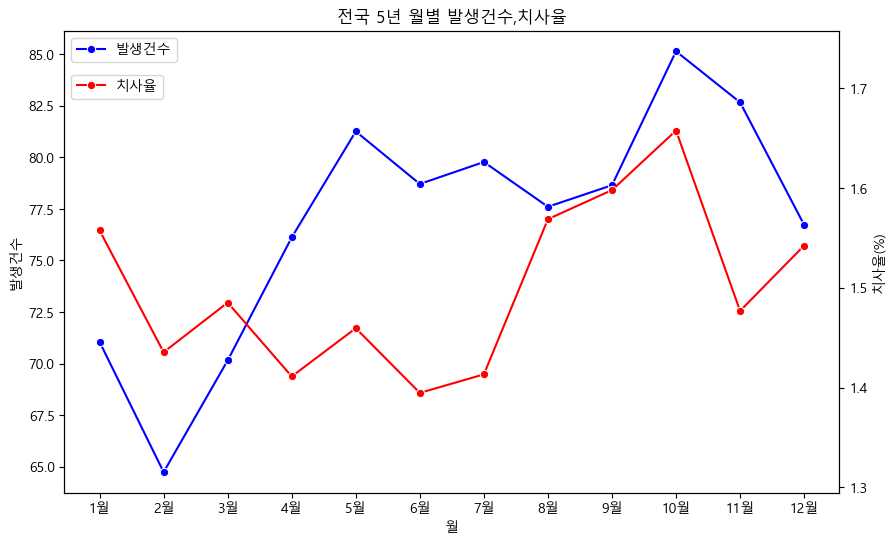

In [60]:
fig, axes = plt.subplots(figsize=(10, 6))
axe2 = axes.twinx()

c1 = sns.lineplot(data = d_kr_month_mean_oc, x = d_kr_month_mean_oc.index,
                  y = 0, color = "blue", marker="o",
                  ax = axes).set(ylim=(d_kr_month_mean_oc[0].min()-1,d_kr_month_mean_oc[0].max()+1))
c2 = sns.lineplot(data = fa, x = fa.index, y = 0, color = "red", marker="o",
                  ax = axe2).set(ylim=(fa[0].min()-0.1,fa[0].max()+0.1))

axes_legend = axes.legend(['발생건수'],loc='upper left')
axe2_legend = axe2.legend(['치사율'],loc='upper left')

axes_legend.set_bbox_to_anchor((0, 1))
axe2_legend.set_bbox_to_anchor((0, 0.92))


axes.set_ylabel('발생건수')
axe2.set_ylabel('치사율(%)')
axes.set_xlabel("월")
axes.set_title("전국 5년 월별 발생건수,치사율")
plt.savefig("../images/전국 5년 월별 발생건수,치사율.png")
plt.show()

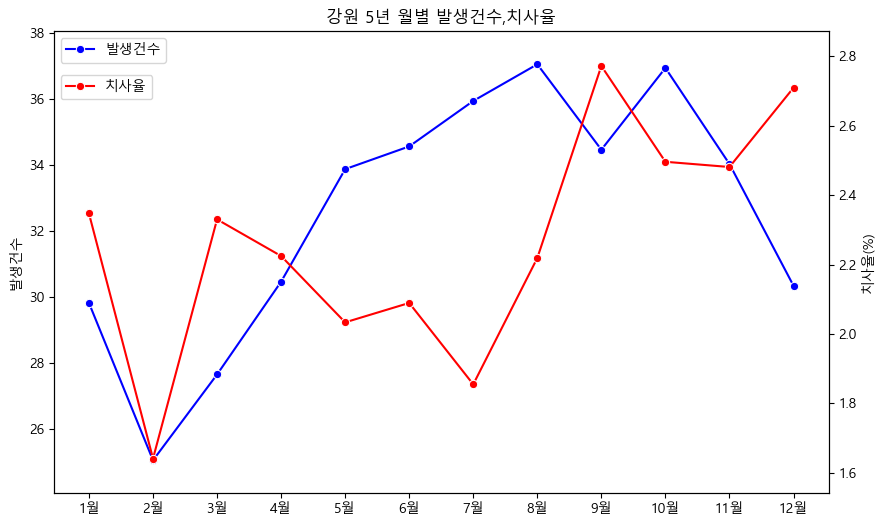

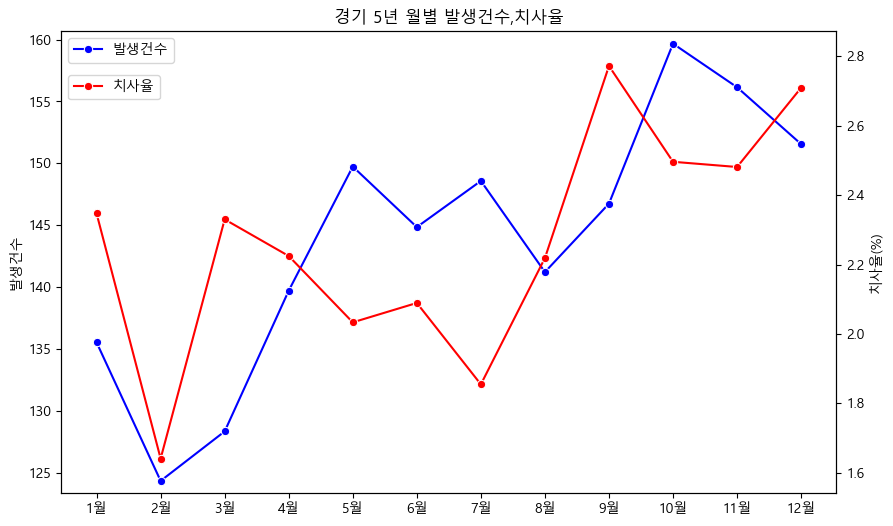

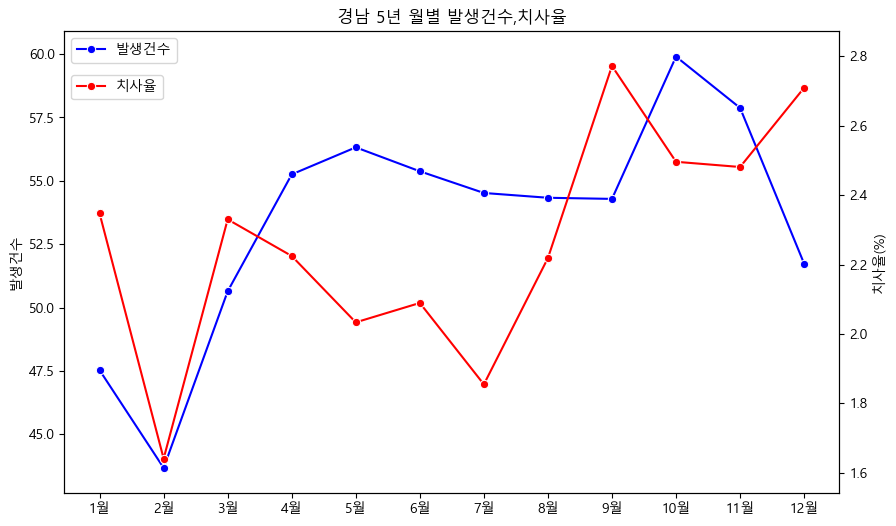

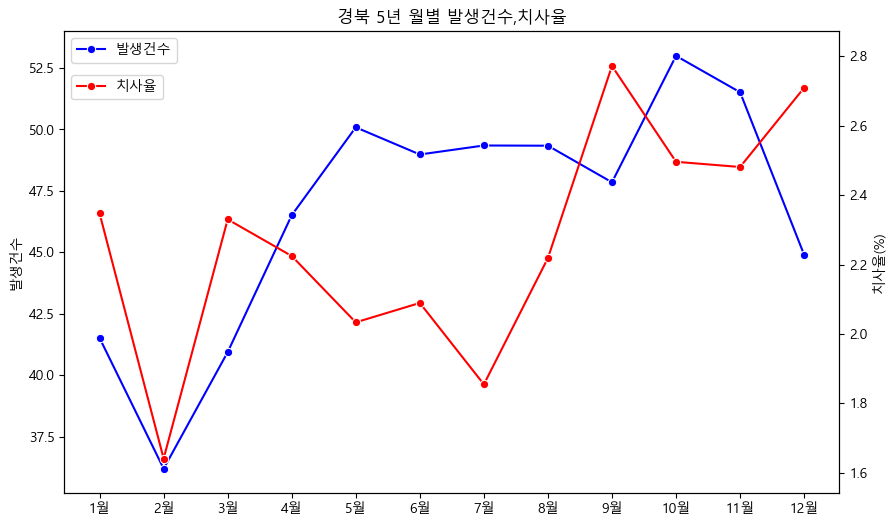

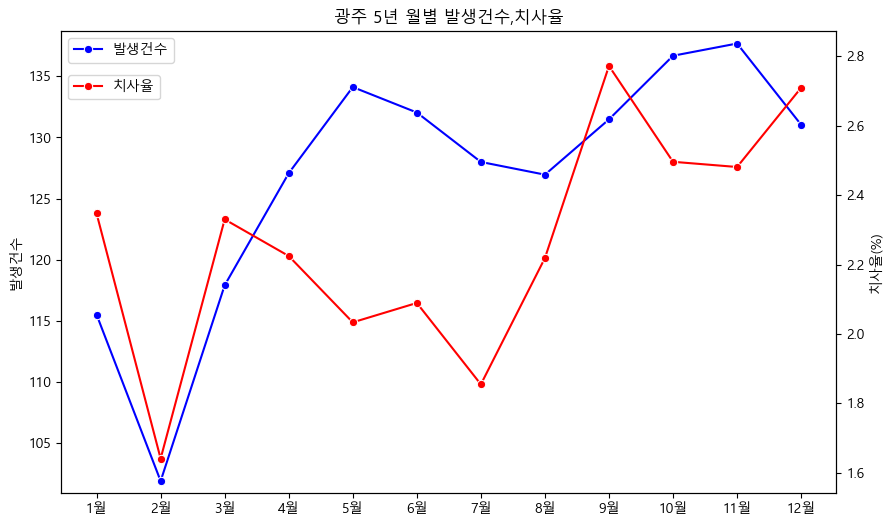

...

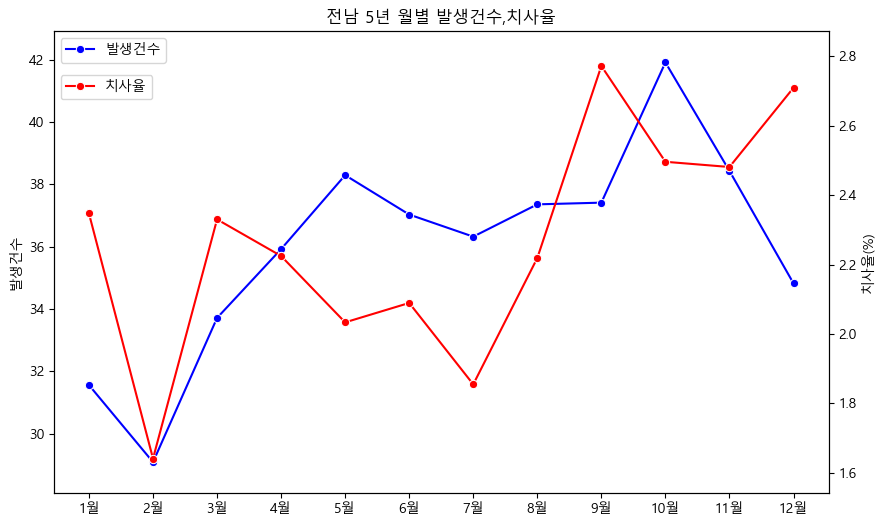

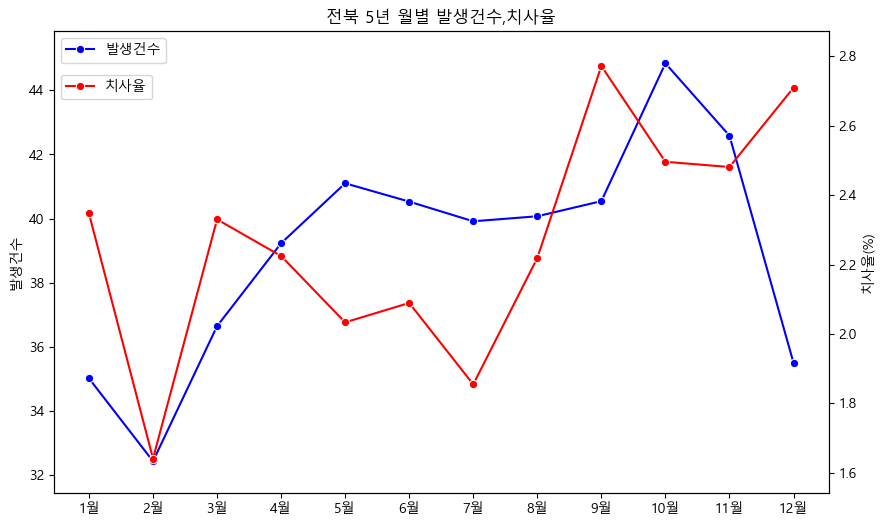

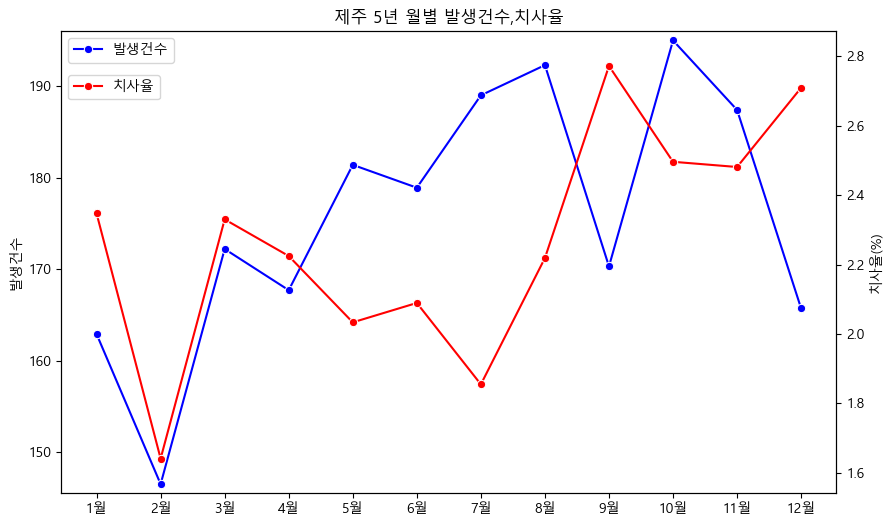

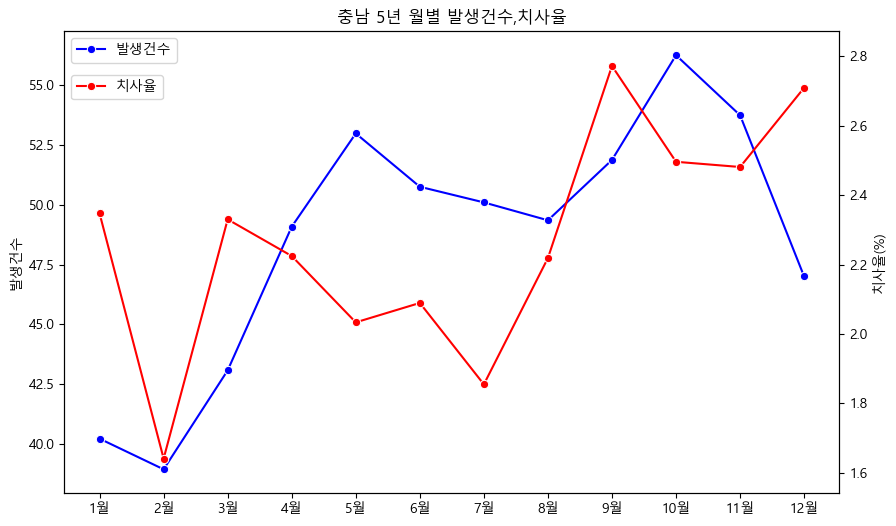

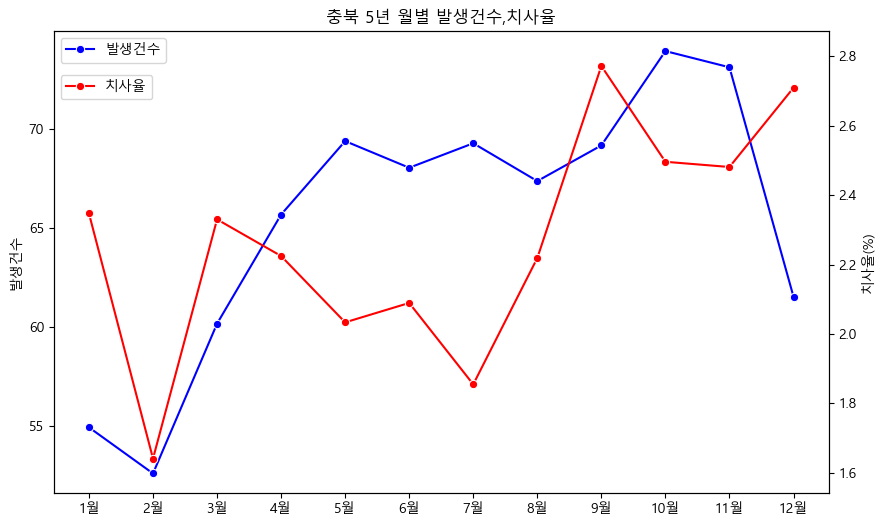

In [61]:
for i in range(17):
    tmp = pd.DataFrame(d_kr_month_si_occ.iloc[i,:]).drop("시도")
    tmp.index = ["1월","2월","3월","4월","5월","6월","7월","8월","9월","10월","11월","12월"]
    sido = d_kr_month_si_occ["시도"][i]
    
    tmp_fa = pd.DataFrame(d_kr_month_si_fa.iloc[0,:-1]/d_kr_month_si_occ.iloc[0,1:]*100)

    fig, axes = plt.subplots(figsize=(10, 6))
    axe2 = axes.twinx()

    c1 = sns.lineplot(data = tmp, x = tmp.index,
                      y = i, color = "blue", marker="o",
                      ax = axes).set(ylim=(tmp[i].min()-1,tmp[i].max()+1))
    c2 = sns.lineplot(data = tmp_fa, x = tmp_fa.index, y = 0, color = "red", marker="o",
                      ax = axe2).set(ylim=(tmp_fa[0].min()-0.1,tmp_fa[0].max()+0.1))

    axes_legend = axes.legend(['발생건수'],loc='upper left')
    axe2_legend = axe2.legend(['치사율'],loc='upper left')

    axes_legend.set_bbox_to_anchor((0, 1))
    axe2_legend.set_bbox_to_anchor((0, 0.92))


    axes.set_ylabel('발생건수')
    axe2.set_ylabel('치사율(%)')
    axes.set_title(f"{sido} 5년 월별 발생건수,치사율")
    plt.savefig(f"../images/{sido} 5년 월별 발생건수,치사율")
    plt.show()

# 사고유형1 별 막대그래프

In [62]:
#경고 무시
import warnings
warnings.filterwarnings("ignore")

#한글 출력
from matplotlib import font_manager, rc
plt.rcParams["axes.unicode_minus"] = False #-표시 깨짐 방지
#f_path = "/Library/Fonts/AppleGothic.ttf" # Mac 전용
f_path = "C:/Windows/Fonts/malgun.ttf"
font_name = font_manager.FontProperties(fname = f_path).get_name()
rc("font", family = font_name)

In [63]:
import folium
import pandas as pd
import numpy as np
import glob
import seaborn as sns
import matplotlib.pyplot as plt

In [64]:
file_dirs = glob.glob("../data/result/*.xlsx")
files = []
for f_dir in file_dirs:
    tmp = pd.read_excel(f_dir)
    files.append(tmp)
data_kr = pd.concat(files)
data_kr.head()

,시도,구,연도,발생_가을(9~11월)_x,발생_겨울(12~2월)_x,발생_봄(3~5월)_x,발생_여름(6~8월)_x,사망_가을(9~11월)_x,사망_겨울(12~2월)_x,사망_봄(3~5월)_x,...,발생_음주O,발생_음주X,사망_음주O,사망_음주X,발생_평일,발생_휴일,사망_평일,사망_휴일,발생_전체,사망_전체
0,강원,강릉시,2018,241,220,221,236,5,4,8,...,77,841,3,19,635,283,15,7,918,22
1,강원,강릉시,2019,238,177,229,244,2,1,4,...,78,810,3,11,601,287,10,4,888,14
2,강원,강릉시,2020,200,196,216,236,5,1,3,...,94,754,3,15,589,259,14,4,848,18
3,강원,강릉시,2021,159,156,177,161,4,5,3,...,58,595,2,15,443,210,10,7,653,17
4,강원,강릉시,2022,216,157,142,197,6,5,3,...,66,646,0,14,487,225,13,1,712,14


In [65]:
d_kr_acc1 = data_kr.loc[:,["발생_차대사람","발생_차대차","발생_차량단독","발생_철길건널목","사망_차대사람","사망_차대차","사망_차량단독","사망_철길건널목"]]

d_kr_acc1_si = data_kr.loc[:,["시도","발생_차대사람","발생_차대차","발생_차량단독","발생_철길건널목","사망_차대사람","사망_차대차","사망_차량단독","사망_철길건널목"]]

In [66]:
d_kr_acc1_mean = pd.DataFrame(d_kr_acc1.mean())
d_kr_acc1_occ = d_kr_acc1_mean.iloc[:4,:]
d_kr_acc1_occ.index = ["차대사람", "차대차", "차량단독", "철길건널목"]
d_kr_acc1_fa = d_kr_acc1_mean.iloc[4:,:]
d_kr_acc1_fa.index = ["차대사람", "차대차", "차량단독", "철길건널목"]

In [67]:
d_kr_acc1_occ

,0
차대사람,174.823581
차대차,708.809607
차량단독,38.942358
철길건널목,0.017195


In [68]:
d_kr_acc1_fa[0] = d_kr_acc1_fa[0]/d_kr_acc1_occ[0]

In [69]:
d_kr_acc1_fa

,0
차대사람,0.028286
차대차,0.008142
차량단독,0.080379
철길건널목,0.421053


In [70]:
d_kr_acc1_si_mean = d_kr_acc1_si.groupby("시도").mean().reset_index()

In [71]:
d_kr_acc1_si_mean = d_kr_acc1_si_mean.fillna(0)

In [72]:
d_kr_acc1_si_occ = d_kr_acc1_si_mean.iloc[:,1:5]
d_kr_acc1_si_occ.columns = ["차대사람", "차대차", "차량단독", "철길건널목"]
d_kr_acc1_si_fa = d_kr_acc1_si_mean.iloc[:,5:]
d_kr_acc1_si_fa.columns = ["차대사람", "차대차", "차량단독", "철길건널목"]

In [73]:
d_kr_acc1_si_fa = d_kr_acc1_si_fa/d_kr_acc1_si_occ

In [74]:
d_kr_acc1_si_fa = d_kr_acc1_si_fa.fillna(0)

In [75]:
d_kr_acc1_si_fa

,차대사람,차대차,차량단독,철길건널목
0,0.038866,0.010266,0.180475,2.000000
1,0.023854,0.006454,0.053236,0.000000
2,0.044221,0.013453,0.093537,0.000000
3,0.048096,0.015429,0.110447,0.571429
4,0.022280,0.003817,0.030658,0.000000
5,0.018322,0.004045,0.046566,0.000000
6,0.025316,0.004207,0.051707,0.000000
7,0.018067,0.004565,0.054440,0.000000
8,0.015674,0.003188,0.027106,0.000000
9,0.021572,0.010822,0.131868,0.000000


In [76]:
d_kr_acc1_si_occ

,차대사람,차대차,차량단독,철길건널목
0,66.611111,306.311111,17.300000,0.011111
1,292.645161,1366.425806,67.380645,0.012903
2,130.655556,471.611111,39.200000,0.000000
3,88.591304,432.269565,39.286957,0.060870
4,260.320000,1215.760000,44.360000,0.000000
5,287.900000,1266.900000,42.950000,0.000000
6,268.600000,1169.360000,41.000000,0.000000
7,186.112500,528.512500,23.650000,0.012500
8,339.416000,1064.032000,43.680000,0.000000
9,129.800000,683.800000,36.400000,0.000000


import matplotlib.pyplot as plt
 
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12
 
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


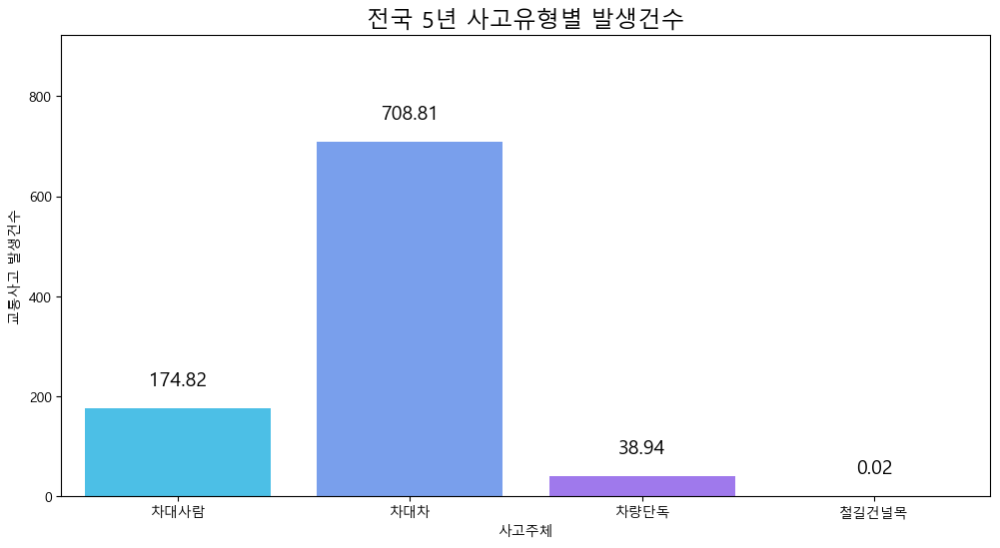

In [77]:
fig, axes = plt.subplots(figsize=(12, 6))
sns.barplot(data = d_kr_acc1_occ, x = d_kr_acc1_occ.index, y = 0,
            palette="cool", ax = axes).set(ylim=(0,d_kr_acc1_occ[0].sum()))

plt.rc('font',size=14
       #, weight = "bold"
      )

for p in axes.patches:
    axes.text(p.get_x() + (p.get_width()/2) ,   # 가로 위치
            p.get_y() + p.get_height()+(d_kr_acc1_occ[0].mean()/5),   # 세로 위치
            f"{p.get_height():.2f}",     # 값 + 표시방법 소수 둘째자리까지 
            ha = 'center' )   # 좌우정렬 중간으로

axes.set_title("전국 5년 사고유형별 발생건수")
axes.set_xlabel("사고주체")
axes.set_ylabel("교통사고 발생건수")
plt.savefig("../images/전국 5년 사고유형별 발생건수")
plt.show()

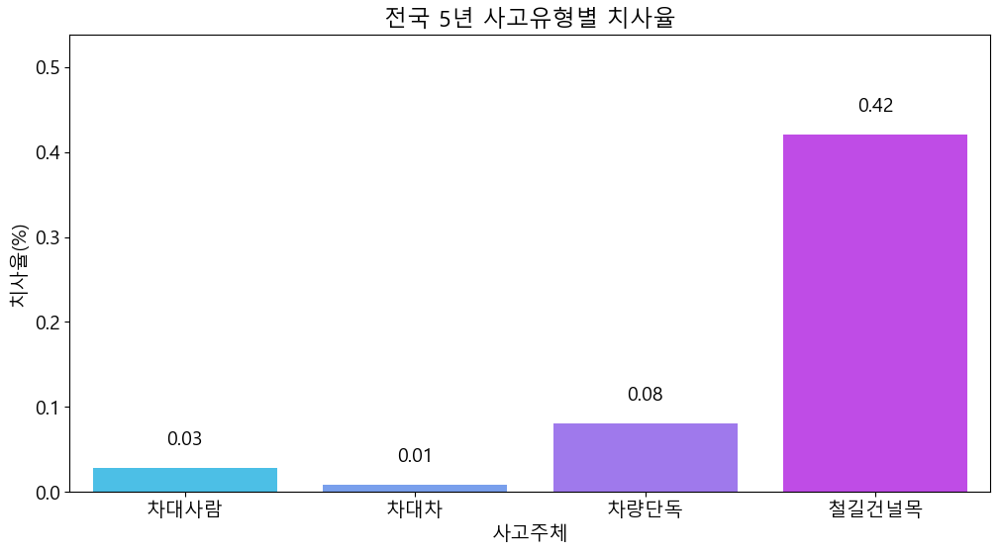

In [78]:
fig, axes = plt.subplots(figsize=(12, 6))
sns.barplot(data = d_kr_acc1_fa, x = d_kr_acc1_fa.index, y = 0, palette="cool", ax = axes).set(ylim=(0,d_kr_acc1_fa[0].sum()))

plt.rc('font', size=14#, weight = "bold"
      )


for p in axes.patches:
    axes.text(p.get_x() + (p.get_width()/2) ,   # 가로 위치
            p.get_y() + p.get_height()+(d_kr_acc1_fa[0].mean()/5),   # 세로 위치
            f"{p.get_height():.2f}",     # 값 + 표시방법 소수 둘째자리까지 
            ha = 'center' )   # 좌우정렬 중간으로



axes.set_title("전국 5년 사고유형별 치사율")
axes.set_xlabel("사고주체")
axes.set_ylabel("치사율(%)")
plt.savefig("../images/전국 5년 사고유형별 치사율")
plt.show()

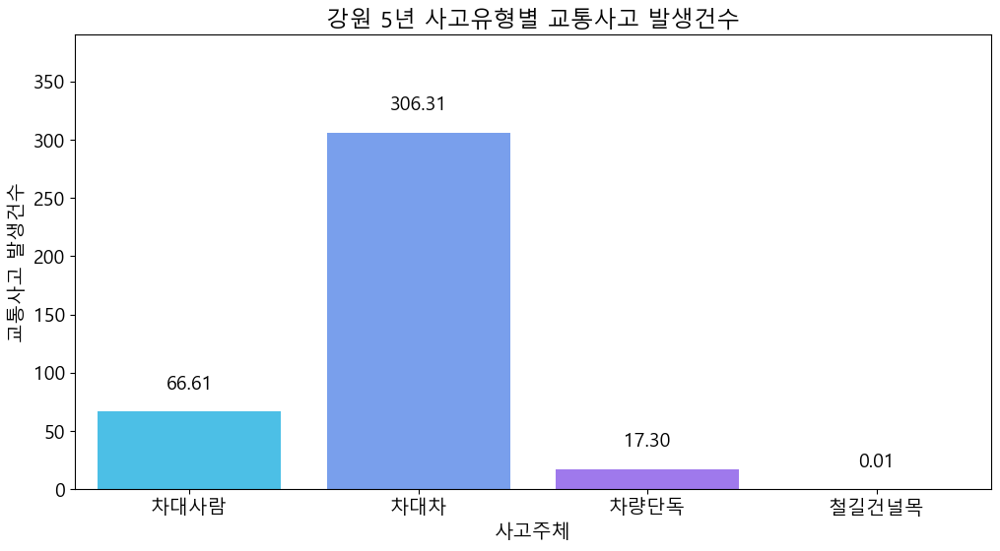

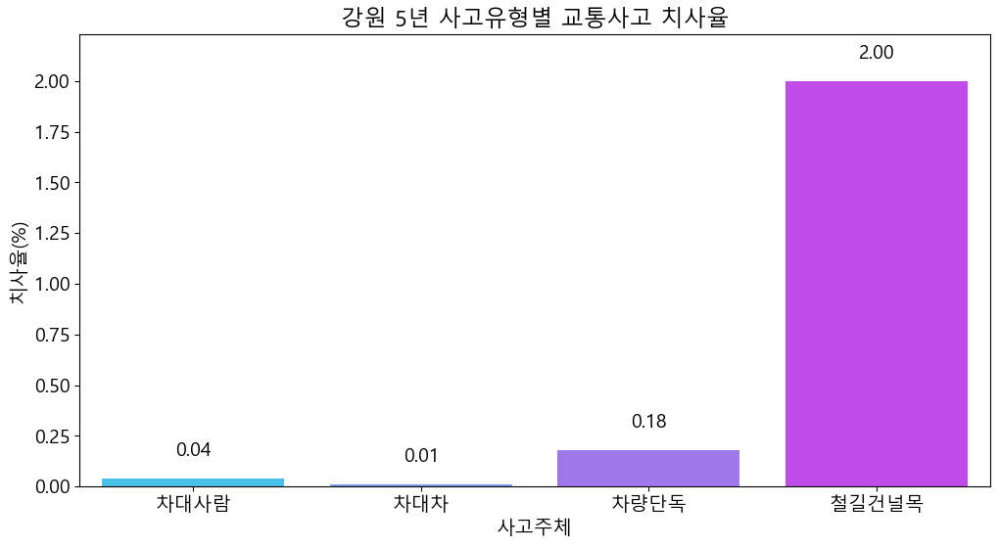

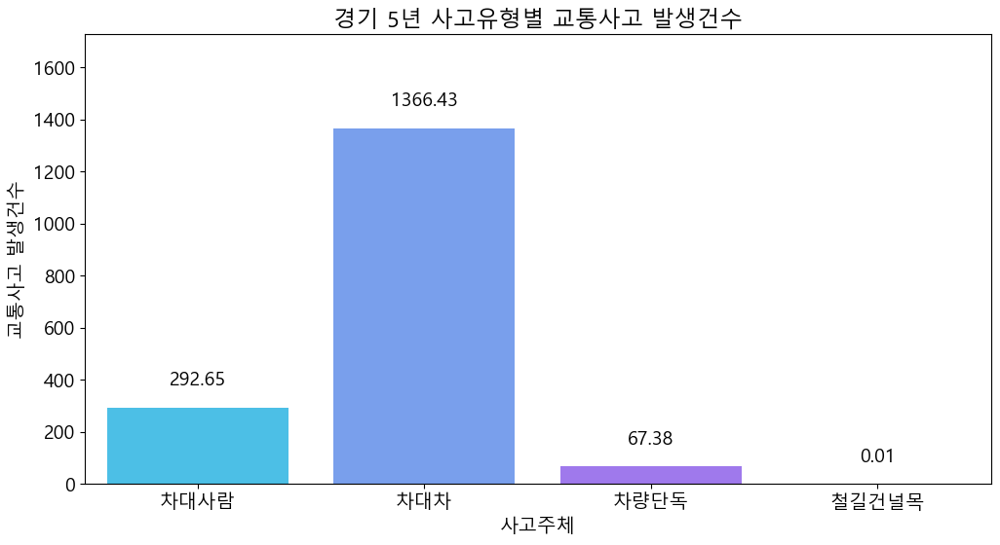

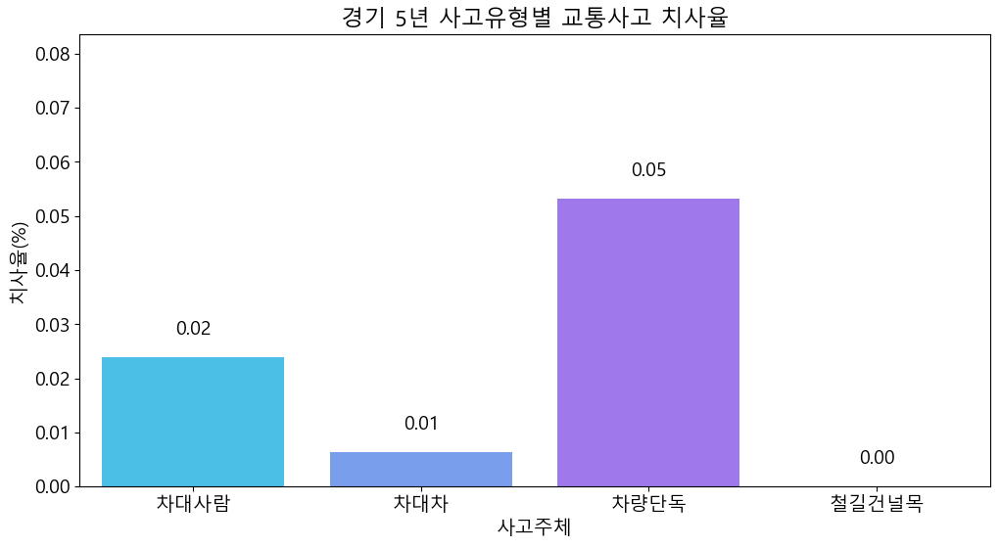

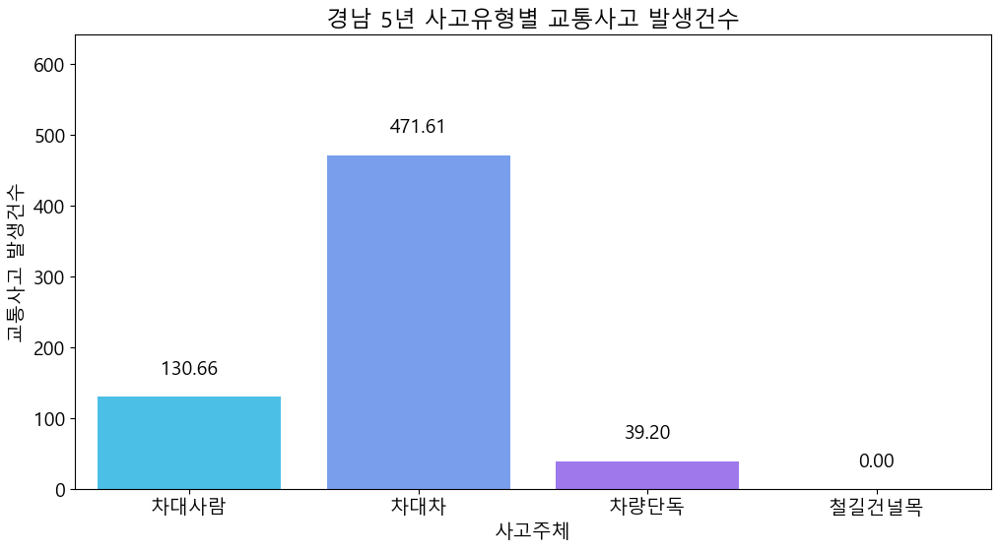

...

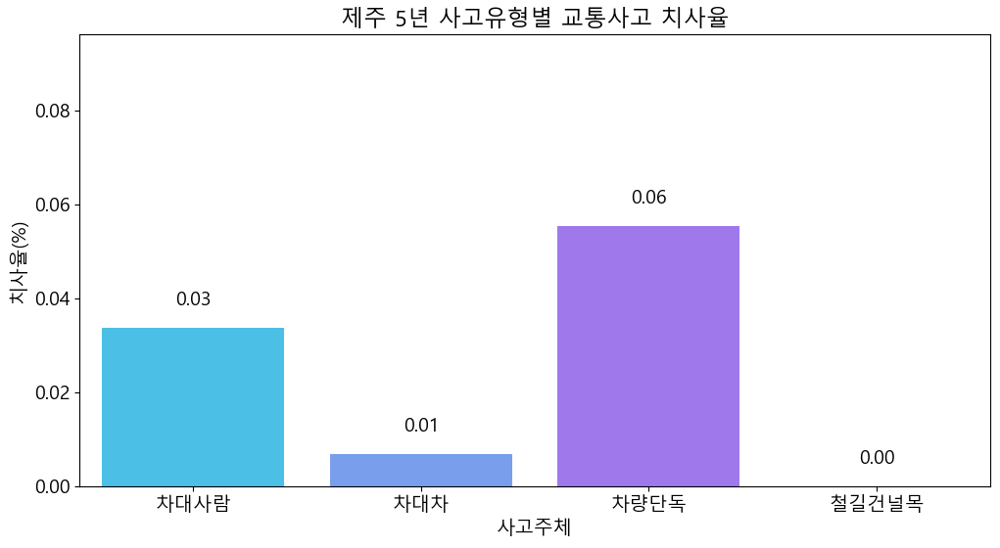

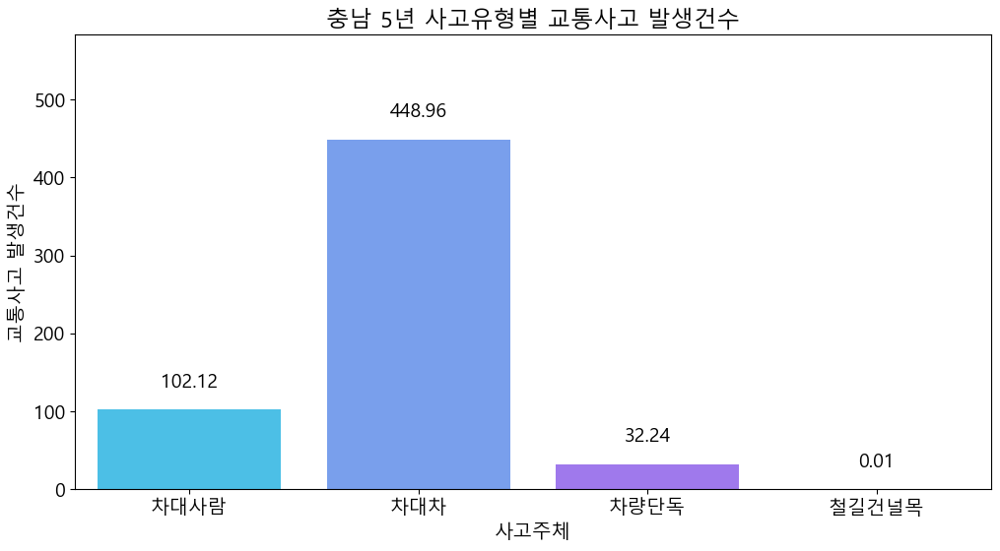

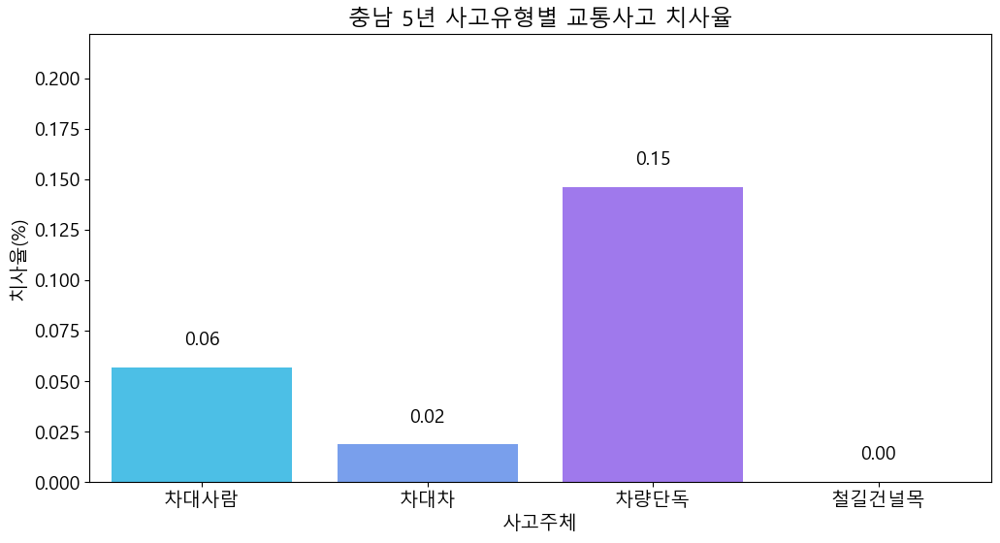

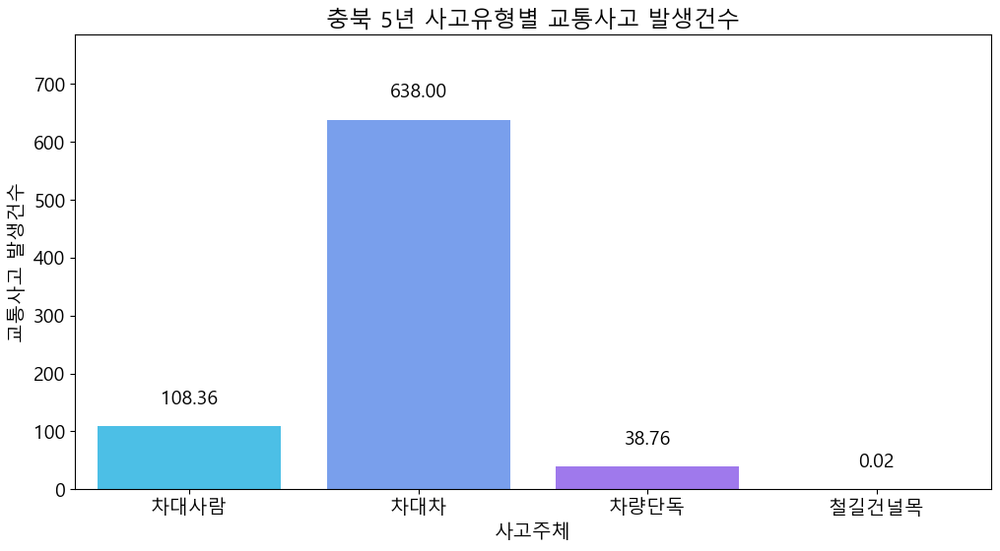

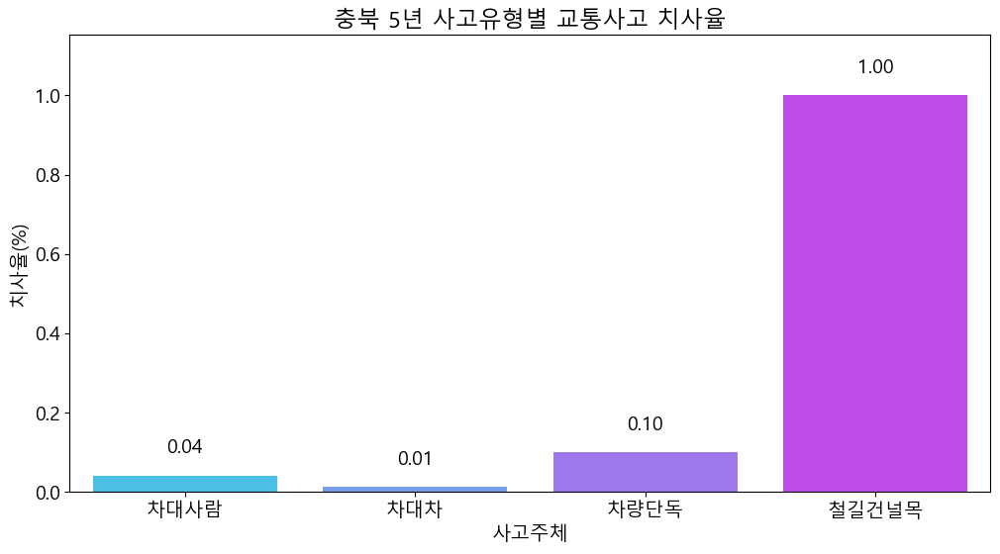

In [79]:
for i in range(17):
    sido = d_kr_acc1_si_mean["시도"][i]
    tmp = pd.DataFrame(d_kr_acc1_si_occ.iloc[i,:])
    tmp_fa = pd.DataFrame(d_kr_acc1_si_fa.iloc[i,:])

    fig, axes = plt.subplots(figsize=(12, 6))
    sns.barplot(data = tmp, x = tmp.index, y = i, palette="cool", ax = axes).set(ylim=(0,tmp[i].sum()))

    plt.rc('font', size=14#, weight = "bold"
          )

    for p in axes.patches:
        axes.text(p.get_x() + (p.get_width()/2) ,   # 가로 위치
                p.get_y() + p.get_height()+(tmp.mean()/5),   # 세로 위치
                f"{p.get_height():.2f}",     # 값 + 표시방법 소수 둘째자리까지 
                ha = 'center' )   # 좌우정렬 중간으로

    axes.set_title(f"{sido} 5년 사고유형별 교통사고 발생건수")
    axes.set_xlabel("사고주체")
    axes.set_ylabel("교통사고 발생건수")
    plt.savefig(f"../images/{sido} 5년 사고유형별 교통사고 발생건수")
    plt.show()
    
    fig, axes = plt.subplots(figsize=(12, 6))
    sns.barplot(data = tmp_fa, x = tmp_fa.index, y = i, palette="cool", ax = axes).set(ylim=(0,tmp_fa[i].sum()))

    plt.rc('font', size=14#, weight = "bold"
          )


    for p in axes.patches:
        axes.text(p.get_x() + (p.get_width()/2) ,   # 가로 위치
                p.get_y() + p.get_height()+(tmp_fa.mean()/5),   # 세로 위치
                f"{p.get_height():.2f}",     # 값 + 표시방법 소수 둘째자리까지 
                ha = 'center' )   # 좌우정렬 중간으로



    axes.set_title(f"{sido} 5년 사고유형별 교통사고 치사율")
    axes.set_xlabel("사고주체")
    axes.set_ylabel("치사율(%)")
    plt.savefig(f"../images/{sido} 5년 사고유형별 교통사고 치사율")
    plt.show()

# 전국 시도구 발생건수 치사율 워드클라우드

In [1]:
import folium
import pandas as pd
import numpy as np
import glob
import json
from folium import plugins
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from wordcloud import WordCloud
from PIL import Image 

In [2]:
#경고 무시
import warnings
warnings.filterwarnings("ignore")

#한글 출력
from matplotlib import font_manager, rc
plt.rcParams["axes.unicode_minus"] = False #-표시 깨짐 방지
#f_path = "/Library/Fonts/AppleGothic.ttf" # Mac 전용
f_path = "C:/Windows/Fonts/malgun.ttf"
font_name = font_manager.FontProperties(fname = f_path).get_name()
rc("font", family = font_name)

In [3]:
file_dirs = glob.glob("../data/result/*.xlsx")
files = []
for f_dir in file_dirs:
    tmp = pd.read_excel(f_dir)
    files.append(tmp)

data_kr = pd.concat(files)
data_kr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1145 entries, 0 to 54
Columns: 207 entries, 시도 to 사망_전체
dtypes: float64(4), int64(201), object(2)
memory usage: 1.8+ MB


In [4]:
d_kr_occ = data_kr.iloc[:,[0,1,-2,-1]]
d_kr_occ.head()

,시도,구,발생_전체,사망_전체
0,강원,강릉시,918,22
1,강원,강릉시,888,14
2,강원,강릉시,848,18
3,강원,강릉시,653,17
4,강원,강릉시,712,14


In [5]:
d_kr_occ_5mean = d_kr_occ.groupby(["시도","구"]).mean().reset_index()
d_kr_occ_5mean.head()

,시도,구,발생_전체,사망_전체
0,강원,강릉시,803.8,17.0
1,강원,고성군,133.4,4.4
2,강원,동해시,336.4,4.8
3,강원,삼척시,320.2,8.2
4,강원,속초시,413.4,4.4


In [6]:
d_kr_occ_5mean["치사율(%)"] = (d_kr_occ_5mean["사망_전체"]/d_kr_occ_5mean["발생_전체"]) * 100
d_kr_occ_5mean.head()

,시도,구,발생_전체,사망_전체,치사율(%)
0,강원,강릉시,803.8,17.0,2.114954
1,강원,고성군,133.4,4.4,3.298351
2,강원,동해시,336.4,4.8,1.426873
3,강원,삼척시,320.2,8.2,2.560899
4,강원,속초시,413.4,4.4,1.064344


In [7]:
d_kr_occ_5mean["지역"] = d_kr_occ_5mean["시도"]+" "+d_kr_occ_5mean["구"]

In [8]:
d_kr_occ_5mean["지역"].iloc[149,] = "세종시"

In [9]:
wc_occ = d_kr_occ_5mean[["지역","발생_전체"]]
wc_occ = wc_occ.set_index(wc_occ["지역"])["발생_전체"]
wc_occ

지역
강원 강릉시     803.8
강원 고성군     133.4
강원 동해시     336.4
강원 삼척시     320.2
강원 속초시     413.4
           ...  
충북 제천시     798.0
충북 증평군     180.2
충북 진천군     495.8
충북 청주시    4532.2
충북 충주시    1202.4
Name: 발생_전체, Length: 229, dtype: float64

In [10]:
wc_da = d_kr_occ_5mean[["지역","사망_전체"]]
wc_da = wc_da.set_index(wc_da["지역"])["사망_전체"]
wc_da

지역
강원 강릉시    17.0
강원 고성군     4.4
강원 동해시     4.8
강원 삼척시     8.2
강원 속초시     4.4
          ... 
충북 제천시    17.4
충북 증평군     3.0
충북 진천군    13.2
충북 청주시    59.4
충북 충주시    27.4
Name: 사망_전체, Length: 229, dtype: float64

In [11]:
wc_fa = d_kr_occ_5mean[["지역","치사율(%)"]]
wc_fa = wc_fa.set_index(wc_fa["지역"])["치사율(%)"]
wc_fa

지역
강원 강릉시    2.114954
강원 고성군    3.298351
강원 동해시    1.426873
강원 삼척시    2.560899
강원 속초시    1.064344
            ...   
충북 제천시    2.180451
충북 증평군    1.664817
충북 진천군    2.662364
충북 청주시    1.310622
충북 충주시    2.278776
Name: 치사율(%), Length: 229, dtype: float64

In [12]:
scaler = MinMaxScaler()
wc_occn = pd.Series(scaler.fit_transform(wc_occ.values.reshape(-1, 1)).flatten(), index=d_kr_occ_5mean["지역"])
wc_occn

지역
강원 강릉시    0.166681
강원 고성군    0.024875
강원 동해시    0.067815
강원 삼척시    0.064388
강원 속초시    0.084102
            ...   
충북 제천시    0.165454
충북 증평군    0.034775
충북 진천군    0.101531
충북 청주시    0.955326
충북 충주시    0.250994
Length: 229, dtype: float64

In [13]:
scaler = MinMaxScaler()
wc_dan = pd.Series(scaler.fit_transform(wc_da.values.reshape(-1, 1)).flatten(), index=d_kr_occ_5mean["지역"])
wc_dan

지역
강원 강릉시    0.275510
강원 고성군    0.061224
강원 동해시    0.068027
강원 삼척시    0.125850
강원 속초시    0.061224
            ...   
충북 제천시    0.282313
충북 증평군    0.037415
충북 진천군    0.210884
충북 청주시    0.996599
충북 충주시    0.452381
Length: 229, dtype: float64

In [14]:
scaler = MinMaxScaler()
wc_fan = pd.Series(scaler.fit_transform(wc_fa.values.reshape(-1, 1)).flatten(), index=d_kr_occ_5mean["지역"])
wc_fan

지역
강원 강릉시    0.157691
강원 고성군    0.267599
강원 동해시    0.093785
강원 삼척시    0.199108
강원 속초시    0.060115
            ...   
충북 제천시    0.163774
충북 증평군    0.115884
충북 진천군    0.208532
충북 청주시    0.082989
충북 충주시    0.172906
Length: 229, dtype: float64

In [15]:
wc_occ_dic = wc_occn.to_dict()
wc_occ_dic

{'강원 강릉시': 0.16668076825450548,
 '강원 고성군': 0.024875200947626706,
 '강원 동해시': 0.06781453591674423,
 '강원 삼척시': 0.06438785007191809,
 '강원 속초시': 0.08410186987054742,
 '강원 양구군': 0.014002876723919113,
 '강원 양양군': 0.030797867839918776,
 '강원 영월군': 0.029740248752009483,
 '강원 원주시': 0.3780776715458161,
 '강원 인제군': 0.01586428631863948,
 '강원 정선군': 0.024494458075979355,
 '강원 철원군': 0.025298248582790426,
 '강원 춘천시': 0.30425585920974707,
 '강원 태백시': 0.03773584905660378,
 '강원 평창군': 0.035959048988916165,
 '강원 홍천군': 0.0662069549031221,
 '강원 화천군': 0.017514172095777984,
 '강원 횡성군': 0.03782045858363652,
 '경기 가평군': 0.07733310770792791,
 '경기 고양시': 0.7823419917082665,
 '경기 과천시': 0.040612572975717076,
 '경기 광명시': 0.21029697943988496,
 '경기 광주시': 0.4167865301632965,
 '경기 구리시': 0.1502242152466368,
 '경기 군포시': 0.13342922413063715,
 '경기 김포시': 0.37185887130890943,
 '경기 남양주시': 0.4705981893561216,
 '경기 동두천시': 0.0717911836872832,
 '경기 부천시': 0.7226076656231493,
 '경기 성남시': 0.7696505626533549,
 '경기 수원시': 1.0,
 '경기 시흥시': 0.502792114

In [16]:
wc_da_dic = wc_dan.to_dict()
wc_da_dic

{'강원 강릉시': 0.2755102040816326,
 '강원 고성군': 0.061224489795918366,
 '강원 동해시': 0.06802721088435373,
 '강원 삼척시': 0.1258503401360544,
 '강원 속초시': 0.061224489795918366,
 '강원 양구군': 0.054421768707482984,
 '강원 양양군': 0.09863945578231291,
 '강원 영월군': 0.09523809523809523,
 '강원 원주시': 0.3775510204081632,
 '강원 인제군': 0.09863945578231291,
 '강원 정선군': 0.0748299319727891,
 '강원 철원군': 0.08843537414965985,
 '강원 춘천시': 0.34013605442176864,
 '강원 태백시': 0.06462585034013604,
 '강원 평창군': 0.1292517006802721,
 '강원 홍천군': 0.21088435374149658,
 '강원 화천군': 0.09523809523809523,
 '강원 횡성군': 0.15306122448979592,
 '경기 가평군': 0.11224489795918367,
 '경기 고양시': 0.6326530612244897,
 '경기 과천시': 0.030612244897959176,
 '경기 광명시': 0.13945578231292516,
 '경기 광주시': 0.3095238095238095,
 '경기 구리시': 0.1020408163265306,
 '경기 군포시': 0.11224489795918367,
 '경기 김포시': 0.346938775510204,
 '경기 남양주시': 0.4829931972789115,
 '경기 동두천시': 0.08163265306122447,
 '경기 부천시': 0.34353741496598633,
 '경기 성남시': 0.5340136054421768,
 '경기 수원시': 0.4931972789115646,
 '경기 시흥시': 0.45

In [17]:
wc_fa_dic = wc_fan.to_dict()
wc_fa_dic

{'강원 강릉시': 0.15769103378182495,
 '강원 고성군': 0.2675992468766444,
 '강원 동해시': 0.0937853587143899,
 '강원 삼척시': 0.1991083059435693,
 '강원 속초시': 0.060115471438724,
 '강원 양구군': 0.4143140016870961,
 '강원 양양군': 0.34105131317257303,
 '강원 영월군': 0.3413162192691508,
 '강원 원주시': 0.07972753092632054,
 '강원 인제군': 0.6363482851604615,
 '강원 정선군': 0.3282483236903509,
 '강원 철원군': 0.37282347997891035,
 '강원 춘천시': 0.09410735099230283,
 '강원 태백시': 0.18125700928447397,
 '강원 평창군': 0.38115212701509293,
 '강원 홍천군': 0.3341208927262163,
 '강원 화천군': 0.5641052913887258,
 '강원 횡성군': 0.42898107924383644,
 '경기 가평군': 0.14146260487134635,
 '경기 고양시': 0.05627981731470088,
 '경기 과천시': 0.07747000204023871,
 '경기 광명시': 0.0440243469655587,
 '경기 광주시': 0.05010873421444972,
 '경기 구리시': 0.04825481295891839,
 '경기 군포시': 0.0675550922072605,
 '경기 김포시': 0.07226630913825072,
 '경기 남양주시': 0.08230130197419255,
 '경기 동두천시': 0.10768912881108808,
 '경기 부천시': 0.018093500079268743,
 '경기 성남시': 0.04309935537868859,
 '경기 수원시': 0.01961230986506167,
 '경기 시흥시': 0.06916

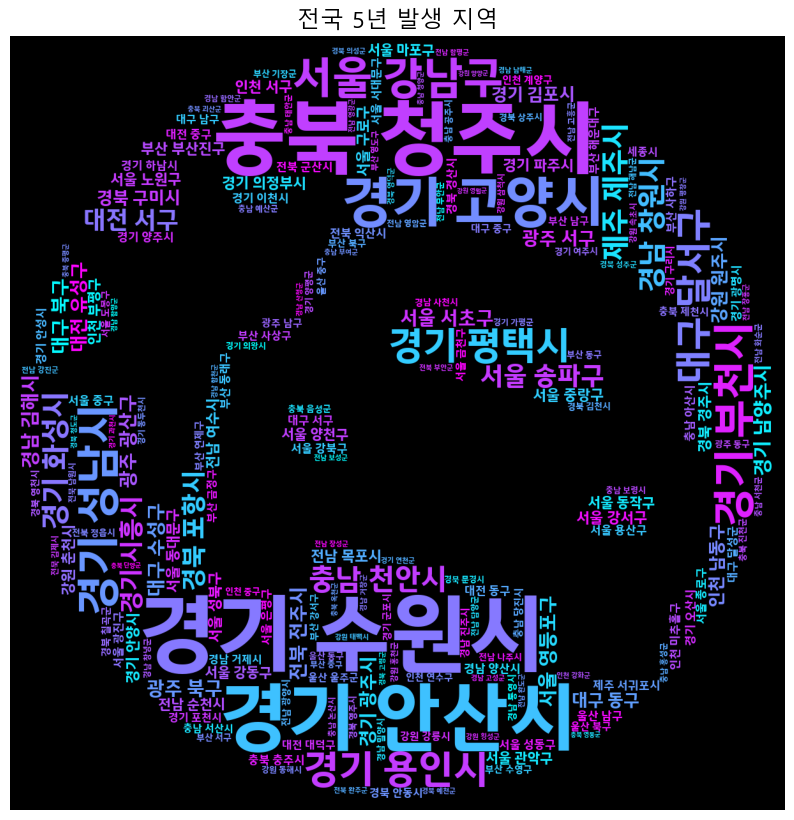

In [97]:
masking_image = np.array(Image.open("../img/car-crash.1024x819.png"))

word_cloud = WordCloud(font_path="../font/Sejong hospital Bold.ttf", # font_path="C:/Windows/Fonts/NanumSquareB.ttf"
                       width=2000, height=1000, 
                       colormap="cool",
                       mask=masking_image, # masking
                       background_color='black').generate_from_frequencies(wc_occ_dic)

plt.figure(figsize=(8,8))
plt.imshow(word_cloud)
plt.title("전국 5년 발생 지역")
plt.axis("off")
plt.tight_layout(pad=0)
plt.savefig("../images/전국 5년 발생 지역.png")
plt.show()

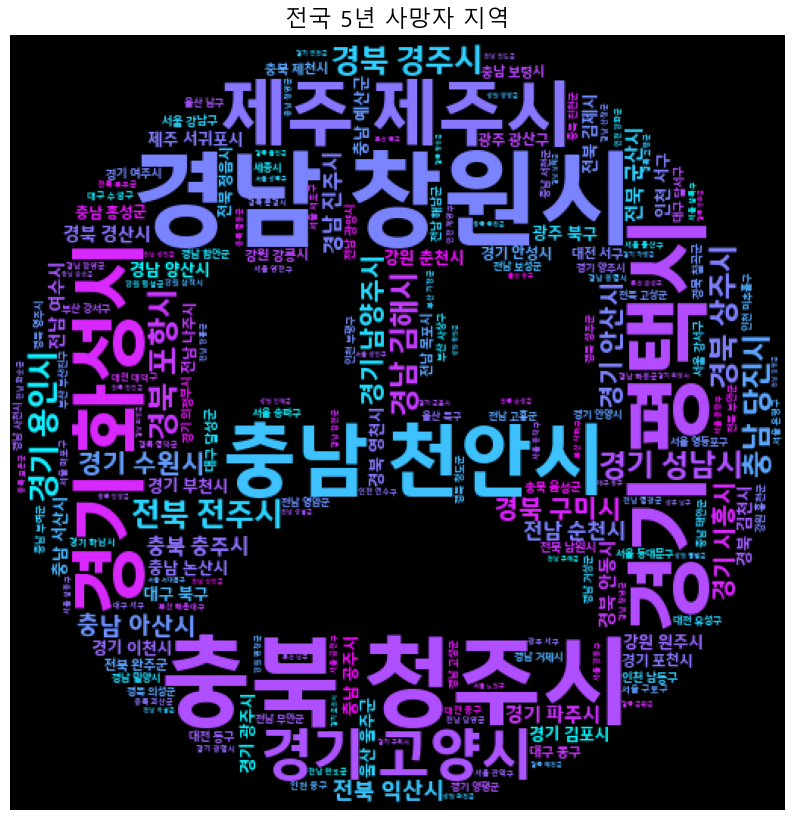

In [98]:
masking_image = np.array(Image.open("../img/dead.512x512.png"))

word_cloud = WordCloud(font_path="../font/Sejong hospital Bold.ttf", # font_path="C:/Windows/Fonts/NanumSquareB.ttf"
                       width=2000, height=1000, 
                       colormap="cool",
                       mask=masking_image, # masking
                       background_color='black').generate_from_frequencies(wc_da_dic)

plt.figure(figsize=(8,8))
plt.imshow(word_cloud)
plt.title("전국 5년 사망자 지역")
plt.axis("off")
plt.tight_layout(pad=0)
plt.savefig("../images/전국 5년 사망자 지역.png")
plt.show()

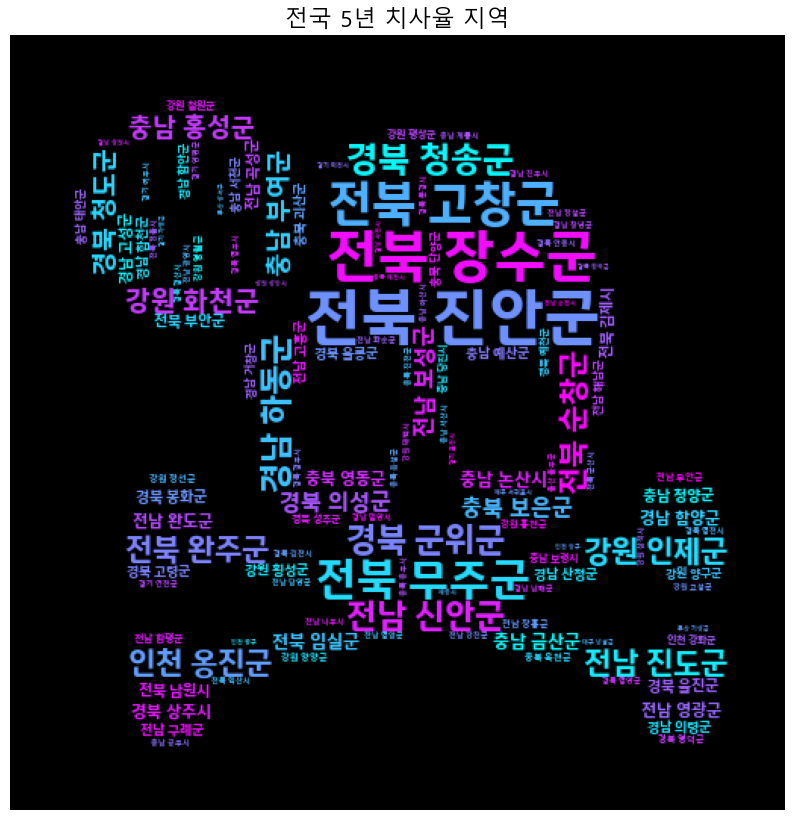

In [99]:
masking_image = np.array(Image.open("../img/fatal.png"))

word_cloud = WordCloud(font_path="../font/Sejong hospital Bold.ttf", # font_path="C:/Windows/Fonts/NanumSquareB.ttf"
                       width=2000, height=1000, 
                       colormap="cool",
                       mask=masking_image, # masking
                       background_color='black').generate_from_frequencies(wc_fa_dic)

plt.figure(figsize=(8,8))
plt.imshow(word_cloud)
plt.title("전국 5년 치사율 지역")
plt.axis("off")
plt.tight_layout(pad=0)
plt.savefig("../images/전국 5년 치사율 지역.png")
plt.show()

In [18]:
data_kr.head()

,시도,구,연도,발생_가을(9~11월)_x,발생_겨울(12~2월)_x,발생_봄(3~5월)_x,발생_여름(6~8월)_x,사망_가을(9~11월)_x,사망_겨울(12~2월)_x,사망_봄(3~5월)_x,...,발생_음주O,발생_음주X,사망_음주O,사망_음주X,발생_평일,발생_휴일,사망_평일,사망_휴일,발생_전체,사망_전체
0,강원,강릉시,2018,241,220,221,236,5,4,8,...,77,841,3,19,635,283,15,7,918,22
1,강원,강릉시,2019,238,177,229,244,2,1,4,...,78,810,3,11,601,287,10,4,888,14
2,강원,강릉시,2020,200,196,216,236,5,1,3,...,94,754,3,15,589,259,14,4,848,18
3,강원,강릉시,2021,159,156,177,161,4,5,3,...,58,595,2,15,443,210,10,7,653,17
4,강원,강릉시,2022,216,157,142,197,6,5,3,...,66,646,0,14,487,225,13,1,712,14


In [19]:
wc_col = data_kr.iloc[:,11:205]
wc_col

,발생_가을(9~11월)_y,발생_겨울(12~2월)_y,발생_봄(3~5월)_y,발생_여름(6~8월)_y,사망_가을(9~11월)_y,사망_겨울(12~2월)_y,사망_봄(3~5월)_y,사망_여름(6~8월)_y,발생_기타_x,발생_눈,...,사망_11,사망_12,발생_음주O,발생_음주X,사망_음주O,사망_음주X,발생_평일,발생_휴일,사망_평일,사망_휴일
0,241,220,221,236,5,4,8,5,1,1,...,1,3,77,841,3,19,635,283,15,7
1,238,177,229,244,2,1,4,7,1,6,...,0,1,78,810,3,11,601,287,10,4
2,200,196,216,236,5,1,3,9,2,2,...,0,0,94,754,3,15,589,259,14,4
3,159,156,177,161,4,5,3,5,3,5,...,2,1,58,595,2,15,443,210,10,7
4,216,157,142,197,6,5,3,0,2,2,...,3,2,66,646,0,14,487,225,13,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50,394,296,349,310,5,8,6,8,2,10,...,2,3,127,1222,3,24,950,399,21,6
51,370,299,362,333,11,6,11,8,0,6,...,7,1,94,1270,5,31,949,415,24,12
52,335,243,256,265,8,3,8,2,2,5,...,1,2,88,1011,1,20,763,336,16,5
53,332,243,278,294,9,5,5,6,3,6,...,3,2,87,1060,1,24,802,345,16,9


In [20]:
colnames = []
for i in wc_col.columns:
    if (i[-2:] == "_y" or i[-2:] == "_x"):
        tmp = i[:-2]
        colnames.append(tmp)
    else:
        colnames.append(i)
    
colnames

['발생_가을(9~11월)',
 '발생_겨울(12~2월)',
 '발생_봄(3~5월)',
 '발생_여름(6~8월)',
 '사망_가을(9~11월)',
 '사망_겨울(12~2월)',
 '사망_봄(3~5월)',
 '사망_여름(6~8월)',
 '발생_기타',
 '발생_눈',
 '발생_맑음',
 '발생_비',
 '발생_안개',
 '발생_흐림',
 '사망_기타',
 '사망_눈',
 '사망_맑음',
 '사망_비',
 '사망_안개',
 '사망_흐림',
 '발생_과속',
 '발생_교차로운행방법위반',
 '발생_기타',
 '발생_보행자보호의무위반',
 '발생_불법유턴',
 '발생_신호위반',
 '발생_안전거리미확보',
 '발생_안전운전불이행',
 '발생_중앙선침범',
 '발생_직진우회전진행방해',
 '발생_차로위반',
 '사망_과속',
 '사망_교차로운행방법위반',
 '사망_기타',
 '사망_보행자보호의무위반',
 '사망_불법유턴',
 '사망_신호위반',
 '사망_안전거리미확보',
 '사망_안전운전불이행',
 '사망_중앙선침범',
 '사망_직진우회전진행방해',
 '사망_차로위반',
 '발생_차대사람',
 '발생_차대차',
 '발생_차량단독',
 '발생_철길건널목',
 '사망_차대사람',
 '사망_차대차',
 '사망_차량단독',
 '사망_철길건널목',
 '발생_공작물추돌',
 '발생_길가장자리구역통행중',
 '발생_도로외이탈(기타)',
 '발생_도로외이탈(추락)',
 '발생_보도통행중',
 '발생_전도',
 '발생_전복',
 '발생_정면충돌',
 '발생_주차차량추돌',
 '발생_차대사람-기타',
 '발생_차대차-기타',
 '발생_차도통행중',
 '발생_차량단독-기타',
 '발생_철길건널목-기타',
 '발생_추돌(진행중)',
 '발생_측면직각충돌',
 '발생_횡단중',
 '발생_후진중추돌',
 '사망_공작물추돌',
 '사망_길가장자리구역통행중',
 '사망_도로외이탈(기타)',
 '사망_도로외이탈(추락)',
 '사망_보도통행중',
 '사망_전도',
 '사망_전복',
 '사망_정면충돌'

In [21]:
colnames_occ_t = []
colnames_da_t = []
for i in colnames:
    if i[:2] == "발생":
        colnames_occ_t.append(i)
    else:
        colnames_da_t.append(i)

#print(len(colnames_occ))
print(len(colnames_occ_t))

97


In [22]:
#len(colnames_da)

In [23]:
wc_col.columns = colnames
wc_col_occ = wc_col.loc[:,colnames_occ_t]
wc_col_occ_mean = wc_col_occ.mean()

In [24]:
wc_col.columns = colnames
wc_col_da = wc_col.loc[:,colnames_da_t]
wc_col_da_mean = wc_col_da.mean()

In [25]:
colnames_occ = []
colnames_da = []
for i in wc_col_occ_mean.index:
    colnames_occ.append(i[3:])

print(len(colnames_occ))

for i in wc_col_da_mean.index:
    colnames_da.append(i[3:])
    
print(len(colnames_da))

105
105


In [26]:
wc_col_occ_mean

발생_가을(9~11월)    246.465502
발생_겨울(12~2월)    212.504803
발생_봄(3~5월)      227.531004
발생_여름(6~8월)     236.090830
발생_기타             8.303930
                   ...    
발생_12            76.725764
발생_음주O           69.682096
발생_음주X          852.910044
발생_평일           642.717904
발생_휴일           279.874236
Length: 105, dtype: float64

In [27]:
scaler = MinMaxScaler()
wc_col_occn = pd.Series(scaler.fit_transform(wc_col_occ_mean.values.reshape(-1, 1)).flatten(), index=colnames_occ)
wc_col_occn

가을(9~11월)    0.288956
겨울(12~2월)    0.249138
봄(3~5월)      0.266755
여름(6~8월)     0.276792
기타           0.009716
               ...   
12           0.089939
음주O          0.081681
음주X          1.000000
평일           0.753554
휴일           0.328127
Length: 105, dtype: float64

In [28]:
wc_col_occ_dic = wc_col_occn.to_dict()
wc_col_occ_dic

{'가을(9~11월)': 0.28895576727359407,
 '겨울(12~2월)': 0.2491375196169594,
 '봄(3~5월)': 0.2667554430047028,
 '여름(6~8월)': 0.2767916689345645,
 '기타': 0.03170029380604383,
 '눈': 0.005382464745399194,
 '맑음': 0.9595694002256163,
 '비': 0.07013614119685727,
 '안개': 0.0010345599093423434,
 '흐림': 0.03537338251234056,
 '과속': 0.004614464597720758,
 '교차로운행방법위반': 0.0687783169357618,
 '보행자보호의무위반': 0.03652026273287369,
 '불법유턴': 0.00755641716342762,
 '신호위반': 0.12758664824399185,
 '안전거리미확보': 0.10784802044845916,
 '안전운전불이행': 0.6012195073186615,
 '중앙선침범': 0.0445248722720768,
 '직진우회전진행방해': 0.03244883794998108,
 '차로위반': 0.018701635306537075,
 '차대사람': 0.20495703112151128,
 '차대차': 0.8310450875117287,
 '차량단독': 0.04563898448630899,
 '철길건널목': 0.0,
 '공작물추돌': 0.016315714847749404,
 '길가장자리구역통행중': 0.012322114079821537,
 '도로외이탈(기타)': 0.0009505918931961678,
 '도로외이탈(추락)': 0.0020872321117602526,
 '보도통행중': 0.011611457943169758,
 '전도': 0.005485888765286557,
 '전복': 0.0008973438829571296,
 '정면충돌': 0.03784531898766822,
 '주차차량추돌': 0

In [29]:
scaler = MinMaxScaler()
wc_col_dan = pd.Series(scaler.fit_transform(wc_col_da_mean.values.reshape(-1, 1)).flatten(), index=colnames_da)
wc_col_dan

가을(9~11월)    0.305510
겨울(12~2월)    0.252817
봄(3~5월)      0.259343
여름(6~8월)     0.270404
기타           0.008931
               ...   
12           0.092677
음주O          0.088898
음주X          1.000000
평일           0.770747
휴일           0.318151
Length: 105, dtype: float64

In [30]:
wc_col_dan_dic = wc_col_dan.to_dict()
wc_col_dan_dic

{'가을(9~11월)': 0.3055097554273152,
 '겨울(12~2월)': 0.25281670788678207,
 '봄(3~5월)': 0.2593432261610332,
 '여름(6~8월)': 0.27040395713107995,
 '기타': 0.03682330310524869,
 '눈': 0.005839516350645782,
 '맑음': 0.8969497114591921,
 '비': 0.09439406430338004,
 '안개': 0.004877713657598241,
 '흐림': 0.0681505908216543,
 '과속': 0.06650178620500138,
 '교차로운행방법위반': 0.014495740588073645,
 '보행자보호의무위반': 0.0386095081066227,
 '불법유턴': 0.004190711733992855,
 '신호위반': 0.09226435834020336,
 '안전거리미확보': 0.019579554822753503,
 '안전운전불이행': 0.7277411376751854,
 '중앙선침범': 0.07488320967298709,
 '직진우회전진행방해': 0.007488320967298708,
 '차로위반': 0.002610607309700467,
 '차대사람': 0.3885682879912063,
 '차대차': 0.45355866996427585,
 '차량단독': 0.24580928826600712,
 '철길건널목': 0.00015729546305173097,
 '공작물추돌': 0.11830173124484748,
 '길가장자리구역통행중': 0.014976641934597416,
 '도로외이탈(기타)': 0.007763121736740862,
 '도로외이탈(추락)': 0.0307776861775213,
 '보도통행중': 0.00982412750755702,
 '전도': 0.0307776861775213,
 '전복': 0.009755427315196482,
 '정면충돌': 0.06986809563066776,

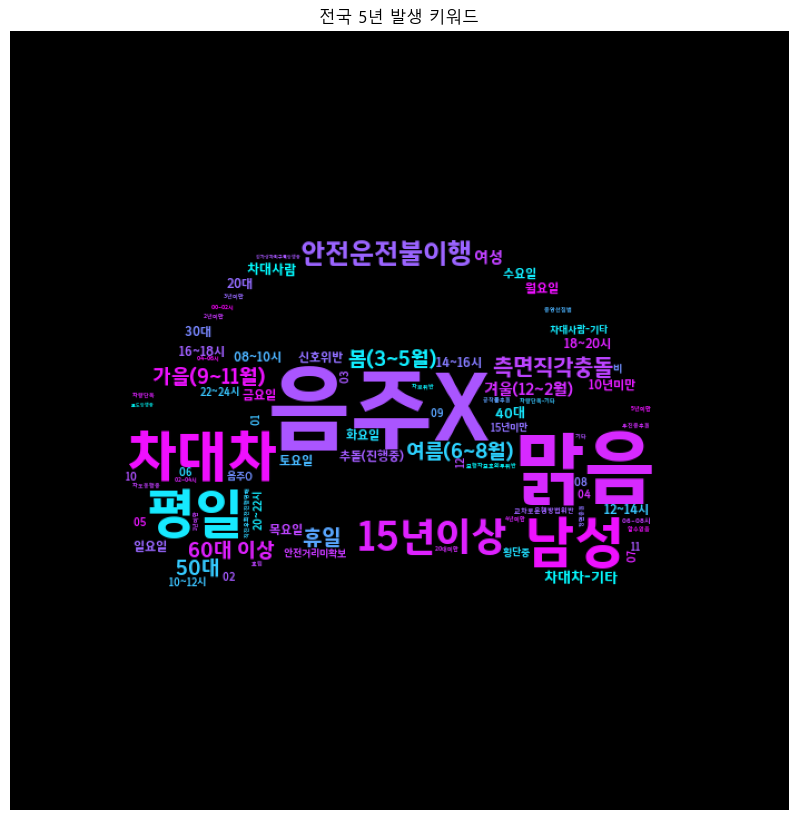

In [41]:
masking_image = np.array(Image.open("../img/car_front.png"))

word_cloud = WordCloud(font_path="../font/Sejong hospital Bold.ttf", # font_path="C:/Windows/Fonts/NanumSquareB.ttf"
                       width=2000, height=1000, 
                       colormap="cool",
                       mask=masking_image, # masking
                       background_color='black').generate_from_frequencies(wc_col_occ_dic)

plt.figure(figsize=(8,8))
plt.imshow(word_cloud)
plt.title("전국 5년 발생 키워드")
plt.axis("off")
plt.tight_layout(pad=0)
plt.savefig("../images/전국 5년 발생 키워드.png")
plt.show()

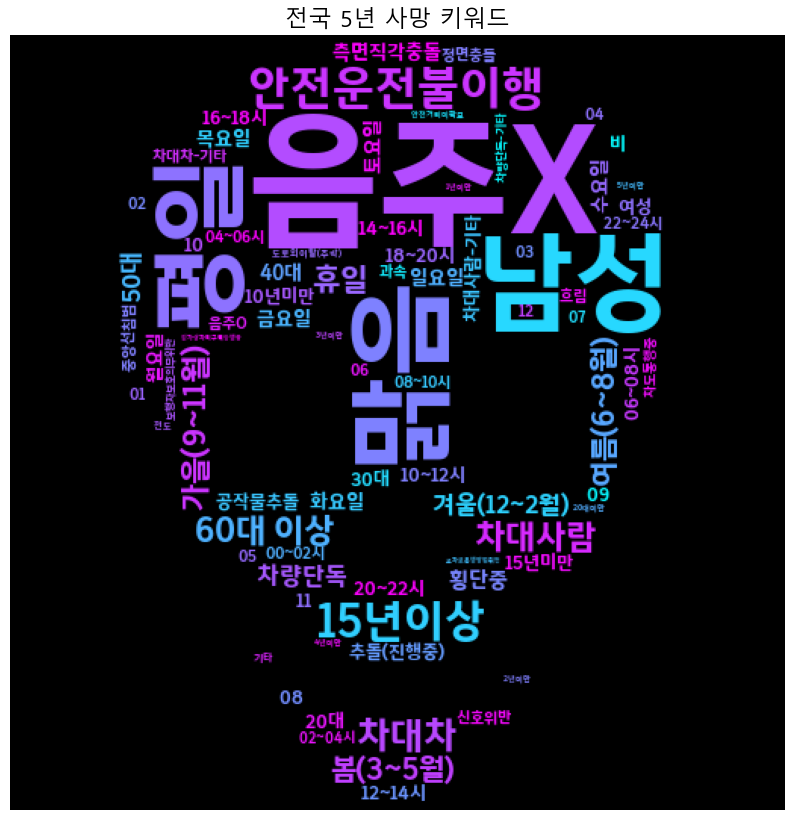

In [126]:
masking_image = np.array(Image.open("../img/skull.png"))

word_cloud = WordCloud(font_path="../font/Sejong hospital Bold.ttf", # font_path="C:/Windows/Fonts/NanumSquareB.ttf"
                       width=2000, height=1000, 
                       colormap="cool",
                       mask=masking_image, # masking
                       background_color='black').generate_from_frequencies(wc_col_dan_dic)

plt.figure(figsize=(8,8))
plt.imshow(word_cloud)
plt.title("전국 5년 사망 키워드")
plt.axis("off")
plt.tight_layout(pad=0)
plt.savefig("../images/전국 5년 사망 키워드.png")
plt.show()